# IS-02 Machine Learning - Data and Web Science
## Lecture 9: Support Vector Machines
## Project 8 - SVM
### <i>Avgitidis Konstantinos AM: 65</i>


In [1]:
import pandas as pd
from sklearn.svm import SVC
import logging
from time import time
from sklearn.preprocessing import StandardScaler
import pickle
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest

In [2]:
import numpy as np
from numpy import unique
from numpy import where
from matplotlib import pyplot
from sklearn.cluster import KMeans

In [3]:
X_train = pd.read_csv('NSL-KDDTrain.csv')
X_test = pd.read_csv('NSL-KDDTest.csv')

In [4]:
X_train.head(5)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,150,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00
1,0,udp,other,SF,146,0,0,0,0,0,...,255,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00
2,0,tcp,private,S0,0,0,0,0,0,0,...,255,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00
3,0,tcp,http,SF,232,8153,0,0,0,0,...,30,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01
4,0,tcp,http,SF,199,420,0,0,0,0,...,255,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [5]:
# X_train.dtypes

In [6]:
# X_train.isna().any()

In [7]:
X_train = pd.get_dummies(X_train,columns=['protocol_type','service','flag'])
X_test = pd.get_dummies(X_test,columns=['protocol_type','service','flag'])
Y_test = [1 if i == 'normal' else 0 for i in X_test.target.values ]
X_test.drop(axis=1, columns='target', inplace = True)

In [11]:
X_train = X_train[X_test.columns]

In [12]:
# X_train = X_train.to_numpy()
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train.values)

In [13]:

# X_test = X_test.to_numpy()
X_test = scaler.fit_transform(X_test.values)

In [15]:
# define the model
kmeans_model = KMeans(n_clusters=2,max_iter=1000000,n_jobs=-1)

In [16]:
# assign each data point to a cluster
kmeans_model.fit_predict(X_train)

In [17]:
Y_pred = kmeans_model.predict(X_test)

In [18]:
results = [1 if i==j else 0 for i,j in zip(Y_test,Y_pred)]

In [20]:
accuracy = results.count(1)/len(results)
accuracy

0.25514549325762953

In [13]:
# get all of the unique clusters
kmeans_clusters = unique(kmeans_result)

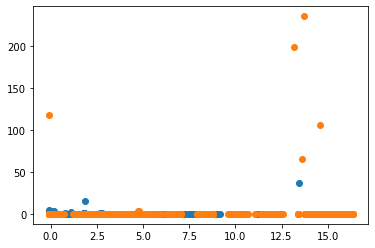

In [14]:
for kmeans_cluster in kmeans_clusters:
    # get data points that fall in this cluster
    index = where(kmeans_result == kmeans_cluster)
    # make the plot
    pyplot.scatter(X_train[index, 0], X_train[index, 1])

# show the DBSCAN plot
pyplot.show()

In [17]:
X_train.shape

(125973, 122)

In [9]:
try:
   grid_search = pickle.load( open( "GridsCVSVM.p", "rb" ) )
except:

    logging.basicConfig(level=logging.INFO,
                        format='%(asctime)s %(levelname)s %(message)s')

    # This dataset is too high-dimensional. Let's do PCA:
    pca = PCA(n_components=8)

    # Maybe some original features where good, too?
    selection = SelectKBest(k=2)

    # Build estimator from PCA and Univariate selection:
    combined_features = FeatureUnion([("pca", pca), ("univ_select", selection)])

    # Use combined features to transform dataset:
    X_features = combined_features.fit(X, y).transform(X)
    print("Combined space has", X_features.shape[1], "features")

    pipeline = Pipeline([('scale', StandardScaler()),("features", combined_features), ("clf", SVC())])

    #Our models
    parameters = [{
        'clf__C': [0.1],
        'clf__kernel': ['poly'],
        'clf__degree': [2],
        'clf__gamma': [0.2],
        'clf__max_iter': [1001337],
    },{
        'clf__C': [10],
        'clf__kernel': ['poly'],
        'clf__degree': [5],
        'clf__gamma': [6],
        'clf__max_iter': [1001337],
    },{
        'clf__C': [0.1],
        'clf__kernel': ['rbf'],
        'clf__gamma': [0.3],
        'clf__max_iter': [1001337],
    },{
        'clf__C': [10],
        'clf__kernel': ['rbf'],
        'clf__gamma': [5],
        'clf__max_iter': [1001337],
    },{
        'clf__C': [0.1],
        'clf__kernel': ['sigmoid'],
        'clf__gamma': [0.5],
        'clf__max_iter': [1001337],
    },{
        'clf__C': [10],
        'clf__kernel': ['sigmoid'],
        'clf__gamma': [2],
        'clf__max_iter': [1001337],
    },{
        'clf__C': [100],
        'clf__kernel': ['sigmoid'],
        'clf__gamma': [5],
        'clf__max_iter': [1001337],
    },
    ]
    scoring = ["f1_micro","accuracy","precision","recall"]
    if __name__ == "__main__":
        grid_search = GridSearchCV(pipeline, parameters,scoring=scoring, n_jobs=-1, refit = 'f1_micro',verbose=10)

        print("Performing grid search...")
        print("pipeline:", [name for name, _ in pipeline.steps])
        t0 = time()
        grid_search.fit(X, y)
        print("done in %0.3fs" % (time() - t0))
        print()

        print("Best score: %0.3f" % grid_search.best_score_)
        pickle.dump( grid_search, open( "GridsCVSVM.p", "wb" ) )

In [10]:
df = pd.DataFrame(grid_search.cv_results_)
# df['max_f1'] = df[max(['split0_test_f1_micro', 'split1_test_f1_micro', 'split2_test_f1_micro',
#        'split3_test_f1_micro', 'split4_test_f1_micro'])].values

In [11]:
svmdf = pd.DataFrame(data=df[['param_clf__C','param_clf__kernel',
                              'param_clf__gamma', 'param_clf__degree',
                              'mean_test_accuracy','mean_test_recall',
                              'mean_test_precision','mean_test_f1_micro',
       ]].values,columns=["C","Kernel","Gamma","Degree","Accuracy","Recall","Precision","F1"])

In [12]:
svmdf


,C,Kernel,Gamma,Degree,Accuracy,Recall,Precision,F1
0,0.1,poly,0.2,2,0.978726,0.915554,0.991654,0.978726
1,10,poly,6,5,0.875885,0.966974,0.831028,0.875885
2,0.1,rbf,0.3,NaN,0.994034,0.980305,0.993801,0.994034
3,10,rbf,5,NaN,0.992727,0.968839,0.999644,0.992727
4,0.1,sigmoid,0.5,NaN,0.947639,0.884535,0.889994,0.947639
5,10,sigmoid,2,NaN,0.945204,0.878872,0.884414,0.945204
6,100,sigmoid,5,NaN,0.949019,0.892342,0.889082,0.949019


In [13]:
svmdf.to_excel('SVM_Results2.xlsx',index=False)